## Étude de la ségmentation avec OpenCV
### Auteur : Loann KAIKA

In [125]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


img_1_path = r"C:\Users\loann\Desktop\cv2\Images\lena.bmp"
img_2_path = r"C:\Users\loann\Desktop\cv2\Images\Maison.bmp"
img_3_path = r"C:\Users\loann\Desktop\cv2\Images\boat.png"
img_4_path = r"C:\Users\loann\Desktop\cv2\Images\grade00.jpg"
img_5_path = r"C:\Users\loann\Desktop\cv2\Images\grade02.jpg"
img_6_path = r"C:\Users\loann\Desktop\cv2\Images\grade03.jpg"


In [126]:
def read_image(img_path):
    image = cv2.imread(img_path)
    if image is None :
        raise FileNotFoundError(f"Image not found at {img_path}")
    return image

image = read_image(img_1_path)
image2 = read_image(img_2_path)
image3 = read_image(img_3_path)

### Ouverture des images (lena.bmp / Maison.bmp / boat.png)

Text(0.5, 1.0, 'boat.png')

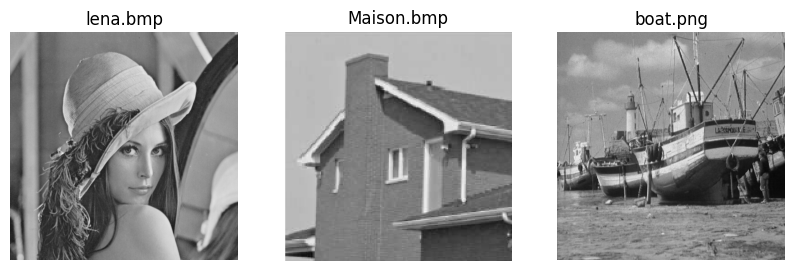

In [127]:

fig, axes = plt.subplots(1, 3, figsize=(10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(image)
axes[0].set_title('lena.bmp')
axes[1].imshow(image2)
axes[1].set_title('Maison.bmp')
axes[2].imshow(image3)
axes[2].set_title('boat.png')

### Résultat après filtre canny

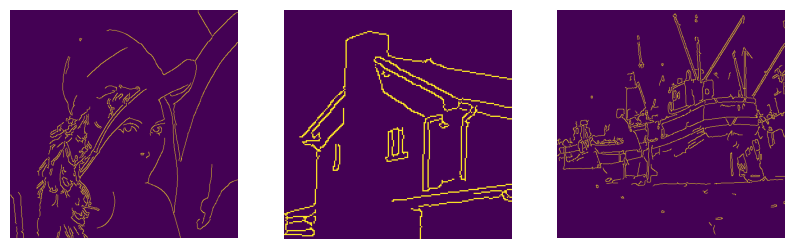

In [128]:
def detect_edges(img, method="canny"):
    "method : canny, sobel, laplacian, scharr"

    # convert to grayscale 
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Reduce noise (light)
    blur = cv2.GaussianBlur(gray, (5,5), 1.2)

    if method == "canny":
        edges = cv2.Canny(blur, 100, 200)
    elif method == "sobel":
        sobelx = cv2.Sobel(blur, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(blur, cv2.CV_64F, 0, 1, ksize=3)
        edges  = cv2.magnitude(sobelx, sobely)
        edges  = cv2.convertScaleAbs(edges)
    elif method == "laplacian":
        lap = cv2.Laplacian(blur, cv2.CV_64F)
        edges = cv2.convertScaleAbs(lap)
    elif method == "scharr":
        scharrx = cv2.Scharr(blur, cv2.CV_64F, 1, 0)
        scharry = cv2.Scharr(blur, cv2.CV_64F, 0, 1)
        edges = cv2.magnitude(scharrx, scharry)
        edges = cv2.convertScaleAbs(edges)
    else:
        raise ValueError("Unknown method")
    return edges

edges_list = []

for img in [image, image2, image3]:
    edges = detect_edges(img, "canny")
    edges_list.append(edges)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(edges_list[0])
axes[1].imshow(edges_list[1])
axes[2].imshow(edges_list[2])

### Résultat après filtre sobel

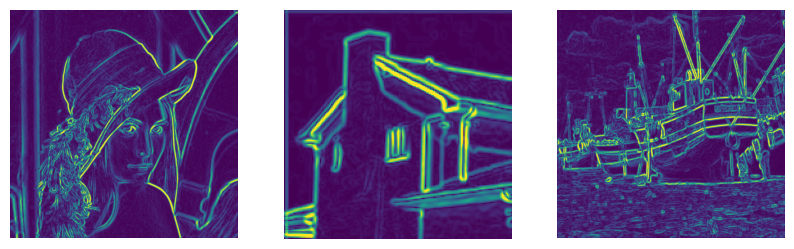

In [129]:
edges_list1 = []

for img in [image, image2, image3]:
    edges = detect_edges(img, "sobel")
    edges_list1.append(edges)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(edges_list1[0])
axes[1].imshow(edges_list1[1])
axes[2].imshow(edges_list1[2])

### Résultat après filtre laplacian

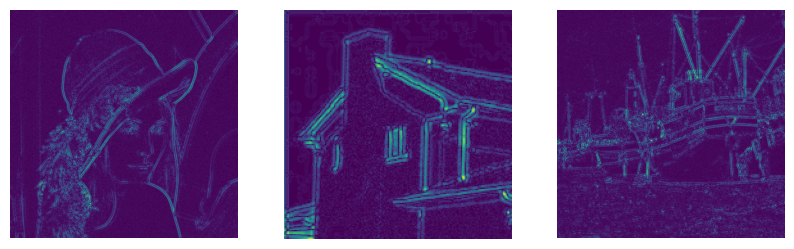

In [130]:
edges_list2 = []

for img in [image, image2, image3]:
    edges = detect_edges(img, "laplacian")
    edges_list2.append(edges)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(edges_list2[0])
axes[1].imshow(edges_list2[1])
axes[2].imshow(edges_list2[2])

### Résultat après filtre scharr

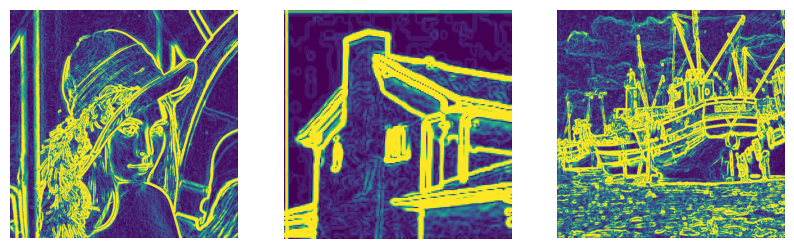

In [131]:
edges_list3 = []

for img in [image, image2, image3]:
    edges = detect_edges(img, "scharr")
    edges_list3.append(edges)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(edges_list3[0])
axes[1].imshow(edges_list3[1])
axes[2].imshow(edges_list3[2])

### Quel filtre semble le plus adapté pour détecter les formes de chaque image ?

Parmi les différents filtres testés (`Canny`, `Sobel`, `Laplacian`, `Scharr`), le filtre **Canny** est généralement le plus performant pour la détection des formes nettes et bien délimitées.  

<br>

### Canny
- Offre des contours précis et fins grâce à un seuillage adaptatif à double seuil.  
- Réduit le bruit efficacement grâce au flou gaussien préalable.  
- Produit une image binaire claire (contours blancs sur fond noir).  
Ce filtre est déal pour extraire les formes complètes d’objets bien contrastés.

<br>

### Sobel
- Bon pour détecter les zones de fort gradient, mais donne souvent des bords épais ou flous.  
- Sensible au bruit si les images ne sont pas bien lissées.  
*Ce filtre est utile pour l’analyse des orientations, mais moins précis pour isoler une forme.*

<br>

### Laplacian
- Détecte les variations rapides d’intensité dans toutes les directions.  
- Produit souvent des contours doublés (positif/négatif autour du bord).  
*Ce filtre est adapté pour la mise en évidence des détails, mais pas pour tracer des formes nettes.*

<br>

### Scharr
- Variante plus précise du Sobel, avec une meilleure sensibilité aux gradients.  
- Donne des résultats plus lisses et homogènes, mais reste moins sélectif que Canny.  
*Ce filtre est un bon compromis entre Sobel et Canny.*

<br>

### Conclusion
Pour détecter clairement la forme globale de chaque image, le filtre **Canny** est le plus adapté.  
Les autres filtres (Sobel, Laplacian, Scharr) sont plus utiles pour analyser la texture ou les transitions d’intensité, mais pas pour isoler des contours nets.


<br>
<br>
<br>
<br>
<br>
<br>

### Ajout de salt & pepper 

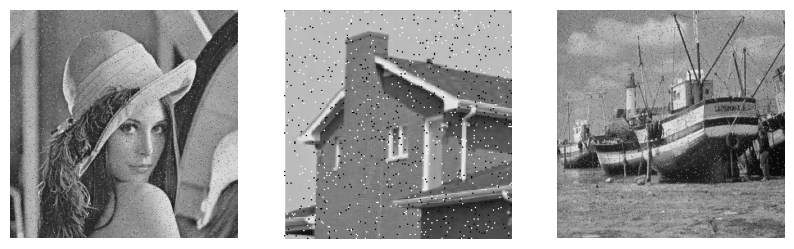

In [132]:
def impulse_noise(img, amount=0.03, salt_pepper=0.5, seed=0):
    
    rng = np.random.default_rng(seed)
    noisy = img.copy()
    h, w = noisy.shape[:2]
    num = int(max(0, min(1, amount)) * h * w)
    num_salt = int(num * max(0, min(1, salt_pepper)))
    num_pepper = num - num_salt

    # Sel (blanc = 255)
    ys = rng.integers(0, h, num_salt)
    xs = rng.integers(0, w, num_salt)
    if noisy.ndim == 2:
        noisy[ys, xs] = 255
    else:
        noisy[ys, xs, :] = 255

    # Poivre (noir = 0)
    ys = rng.integers(0, h, num_pepper)
    xs = rng.integers(0, w, num_pepper)
    if noisy.ndim == 2:
        noisy[ys, xs] = 0
    else:
        noisy[ys, xs, :] = 0

    return noisy

noisy_list = []

for img in [image, image2, image3]:
    noisy = impulse_noise(img, amount=0.03, salt_pepper=0.5)
    noisy_list.append(noisy)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(noisy_list[0])
axes[1].imshow(noisy_list[1])
axes[2].imshow(noisy_list[2])

Après l’ajout de **bruit Salt & Pepper**, les images présentent de nombreux **pixels blancs et noirs isolés**, ce qui **perturbe la détection de contours** et accentue le **bruit visuel** dans les zones homogènes.


On reteste avec les filtres **Canny**, **Laplacian**, **Sobel** et **Scharr** sur les images bruitées par le **Salt & Pepper** afin d’évaluer leur **robustesse au bruit impulsionnel** et d’observer **quel détecteur conserve le mieux les contours réels** malgré la dégradation.


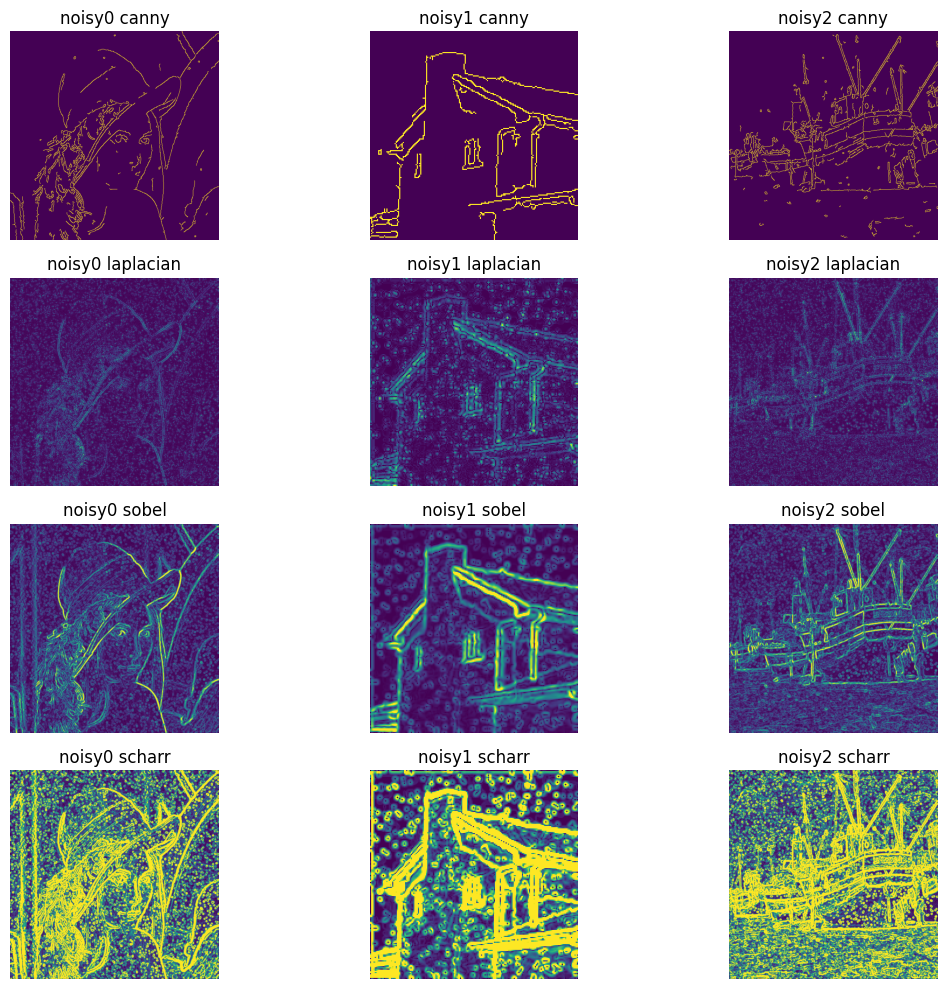

In [133]:
edges_canny_n, edges_lap_n, edges_sobel_n, edges_scharr_n = [], [], [], []

for img in noisy_list:  
    edges_canny_n.append(detect_edges(img, "canny"))
    edges_lap_n.append(detect_edges(img, "laplacian"))
    edges_sobel_n.append(detect_edges(img, "sobel"))
    edges_scharr_n.append(detect_edges(img, "scharr"))

methods_n = [
    ("Canny",     edges_canny_n),
    ("Laplacian", edges_lap_n),
    ("Sobel",     edges_sobel_n),
    ("Scharr",    edges_scharr_n),
]

fig, axes = plt.subplots(4, 3, figsize=(12, 10))
col_names = ["noisy0", "noisy1", "noisy2"]

for r, (name, edges_list) in enumerate(methods_n):
    for c in range(3):
        axes[r, c].imshow(edges_list[c])
        axes[r, c].axis('off')
        axes[r, c].set_title(f"{col_names[c]} {name.lower()}")

    axes[r, 0].set_ylabel(name, rotation=90, fontsize=10)

plt.tight_layout()


Après l’ajout du bruit **Salt & Pepper**, les images présentent de nombreux pixels isolés qui perturbent la détection des contours. Le bruit engendre de **faux bords** dans les zones homogènes, rendant les  contours très bruitées. Les opérateurs dérivatifs comme **Laplacian**, **Sobel** et **Scharr** y sont particulièrement sensibles, tandis que **Canny** conserve partiellement les formes principales grâce à son lissage intégré. Ce type de bruit montre qu’il faut appliquer un **filtre médian** avant la détection pour mieux préserver la netteté et la continuité des contours.



<br>
<br>
<br>
<br>

### Bruit gaussien

Au lieu d’ajouter un bruit **Salt & Pepper**, on applique un **bruit gaussien** aux images afin d’évaluer l’effet d’un **bruit aléatoire continu** sur la détection des contours.


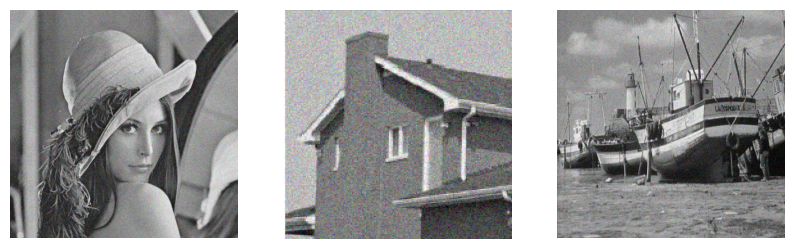

In [134]:
def gaussian_noise(img, sigma=15, seed=0):
    rng = np.random.default_rng(seed)
    noise = rng.normal(0, sigma, img.shape).astype(np.float32)
    noisy = img.astype(np.float32) + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)

noisy_list2 = []

for img in [image, image2, image3]:
    noisy = gaussian_noise(img, sigma=15, seed=0)
    noisy_list2.append(noisy)

fig, axes = plt.subplots(1, 3, figsize = (10, 5))
for i in range (3):
    axes[i].axis('off')

axes[0].imshow(noisy_list2[0])
axes[1].imshow(noisy_list2[1])
axes[2].imshow(noisy_list2[2])

Puis, on répète les étapes de détection en appliquant les différents filtres **Canny**, **Laplacian**, **Sobel** et **Scharr** sur les images bruitées pour comparer leur comportement face au **bruit gaussien**.


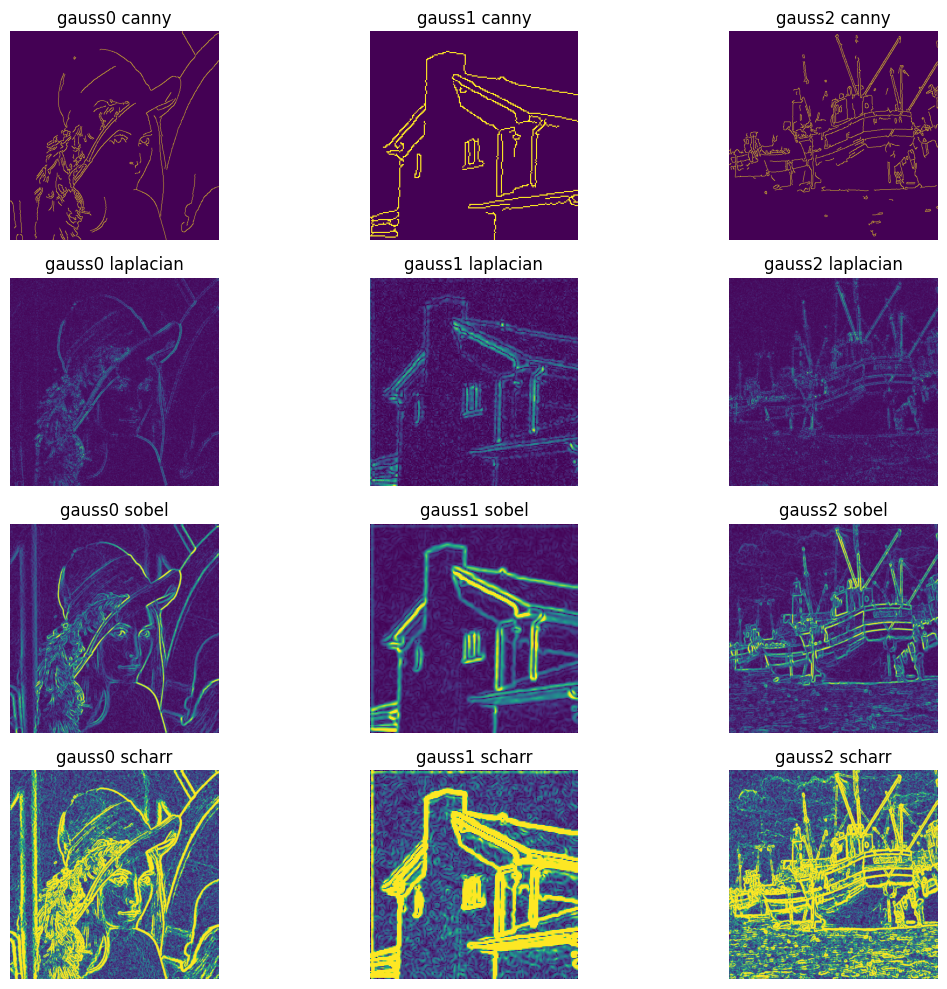

In [135]:
edges_canny_n, edges_lap_n, edges_sobel_n, edges_scharr_n = [], [], [], []

for img in noisy_list2:  
    edges_canny_n.append(detect_edges(img, "canny"))
    edges_lap_n.append(detect_edges(img, "laplacian"))
    edges_sobel_n.append(detect_edges(img, "sobel"))
    edges_scharr_n.append(detect_edges(img, "scharr"))

methods_n = [
    ("Canny",     edges_canny_n),
    ("Laplacian", edges_lap_n),
    ("Sobel",     edges_sobel_n),
    ("Scharr",    edges_scharr_n),
]

fig, axes = plt.subplots(4, 3, figsize=(12, 10))
col_names = ["gauss0", "gauss1", "gauss2"]

for r, (name, edges_list) in enumerate(methods_n):
    for c in range(3):
        axes[r, c].imshow(edges_list[c])
        axes[r, c].axis('off')
        axes[r, c].set_title(f"{col_names[c]} {name.lower()}")

    axes[r, 0].set_ylabel(name, rotation=90, fontsize=10)

plt.tight_layout()


Après l’ajout d’un **bruit gaussien**, les images deviennent légèrement floues et les contours perdent en netteté. Ce bruit, plus diffus que le Salt & Pepper, altère modérément la détection : les **bords principaux** restent visibles, mais les **détails fins** sont atténués. Le filtre **Canny** demeure le plus précis grâce à son lissage intégré, tandis que **Sobel** et **Scharr** produisent des contours plus épais et que **Laplacian** reste le plus sensible au bruit.


<br>
<br>
<br>
<br>
<br>

### Ouverture des images (grade00.jpg / grade02.jpg / garde03.jpg)

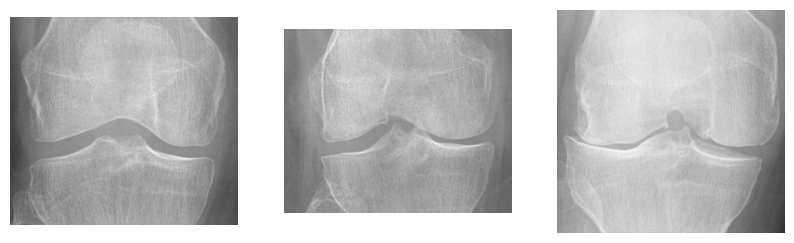

In [136]:
image4 = read_image(img_4_path)
image5 = read_image(img_5_path)
image6 = read_image(img_6_path)

fig, axes = plt.subplots(1, 3, figsize=(10, 5))
for i in range(3):
    axes[i].axis('off')

axes[0].imshow(image4)
axes[1].imshow(image5)
axes[2].imshow(image6)

On réapplique les mêmes filtres que précédemment (**Canny**, **Laplacian**, **Sobel** et **Scharr**) sur les images médicales afin de comparer leur comportement et d’évaluer leur sensibilité au **bruit gaussien**.


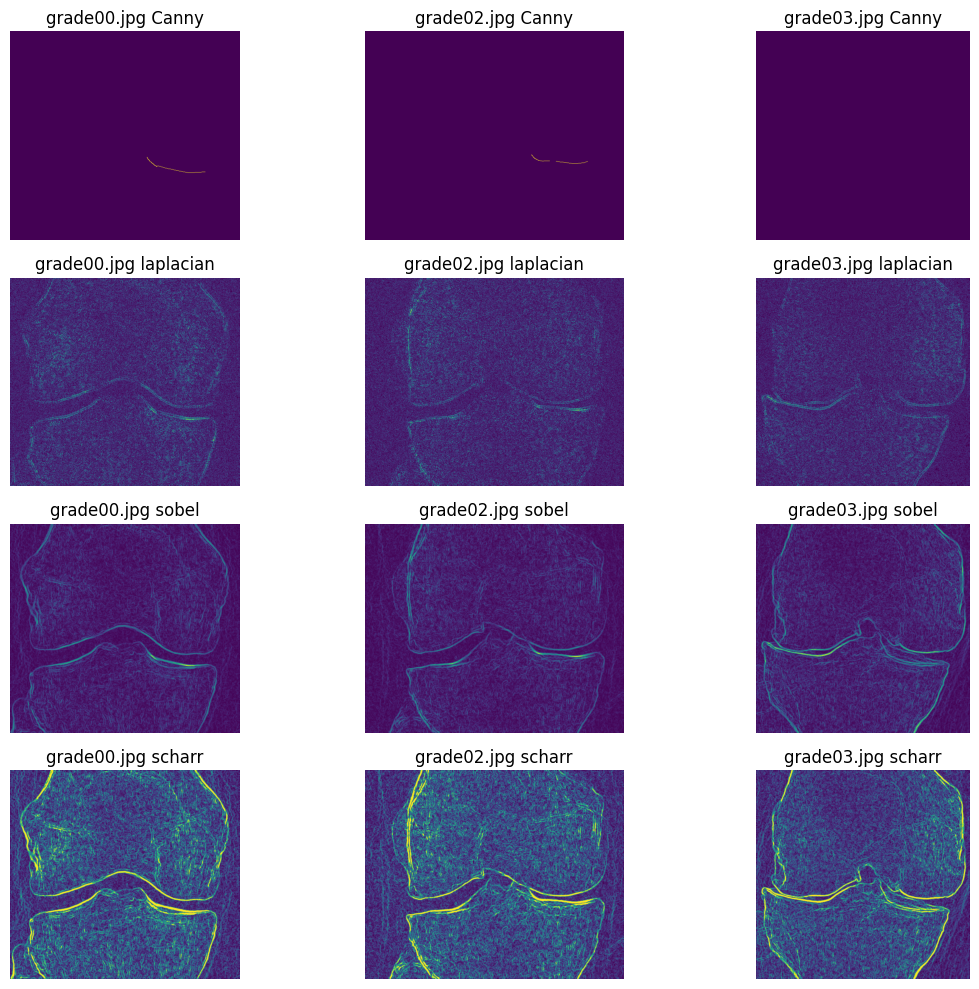

In [137]:
edges_canny, edges_lap, edges_sobel, edges_scharr = [], [], [], []

for img in [image4, image5, image6]:
    edges_canny.append(detect_edges(img, "canny"))
    edges_lap.append(detect_edges(img, "laplacian"))
    edges_sobel.append(detect_edges(img, "sobel"))
    edges_scharr.append(detect_edges(img, "scharr"))

methods = [
    ("Canny",   edges_canny),
    ("Laplacian", edges_lap),
    ("Sobel",   edges_sobel),
    ("Scharr",  edges_scharr),
]

fig, axes = plt.subplots(4, 3, figsize=(12, 10))

for r, (name, edges_list) in enumerate(methods):
    for c in range(3):
        axes[r, c].imshow(edges_list[c])
        axes[r, c].axis('off')
    axes[r, 0].set_ylabel(name, rotation=90, fontsize=10)

axes[0,0].set_title("grade00.jpg Canny")
axes[0,1].set_title("grade02.jpg Canny")
axes[0,2].set_title("grade03.jpg Canny")
axes[1,0].set_title("grade00.jpg laplacian")
axes[1,1].set_title("grade02.jpg laplacian")
axes[1,2].set_title("grade03.jpg laplacian")
axes[2,0].set_title("grade00.jpg sobel")
axes[2,1].set_title("grade02.jpg sobel")
axes[2,2].set_title("grade03.jpg sobel")
axes[3,0].set_title("grade00.jpg scharr")
axes[3,1].set_title("grade02.jpg scharr")
axes[3,2].set_title("grade03.jpg scharr")

plt.tight_layout()


### Comparaison et observations

* **Canny** : presque vide sur les 3 images. Cela indique un lissage trop fort. Il ne capte que quelques traits très fins.
* **Laplacian** : beaucoup de **grain/texture** partout (très sensible au bruit). Les contours de base sont visibles mais noyés dans les hautes fréquences.
* **Sobel** : bons **contours structuraux** avec moins de bruit que le Laplacien.
* **Scharr** : **gradients plus nets et plus intenses** que Sobel (meilleure isotropie), mais bords plus **épais**. Il amplifie aussi les textures fines.

<br>
<br>

### Comparaison entre les 3 images

* Les **structures articulaires** ressortent clairement avec **Sobel/Scharr** pour les trois cas. Mais Scharr s'avère être le meilleur choix dans ce cas d'usage précis.
* **Laplacian** ajoute un motif granuleux sur tout le champ, ce qui **dessert la lisibilité**.
* **Canny** tel quel **échoue** à extraire les bords utiles.

In [138]:
import numpy as np, cv2
import matplotlib.pyplot as plt

def to_gray_u8(img):
    if img.ndim == 3 and img.shape[2] == 3:
        g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)   # tes images viennent de cv2.imread()
    else:
        g = img
    if g.dtype != np.uint8:
        g = cv2.normalize(g, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return g

def preprocess_variants(img):
    g = to_gray_u8(img)
    out = {}
    out["none"]   = g
    out["gauss"]  = cv2.GaussianBlur(g, (5,5), 1.2)
    out["median"] = cv2.medianBlur(g, 5)
    out["bilat"]  = cv2.bilateralFilter(g, d=7, sigmaColor=50, sigmaSpace=7)
    # CLAHE sur 8-bit
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    out["clahe"] = clahe.apply(g)
    return out


### Application de différents pré-traitements avant la détection de contours

Avant d’appliquer la détection de contours, plusieurs méthodes de **pré-traitement** sont testées afin d’améliorer la qualité des résultats. Les filtres utilisés sont le **flou gaussien**, le **filtre médian**, le **filtre bilatéral** et l’**amélioration de contraste CLAHE**, comparés à l’image d’origine sans traitement.
L’objectif est d’évaluer l’impact de ces filtres sur la détection des contours réalisée avec l’opérateur **Scharr**, associé à un seuillage automatique par la méthode d’**Otsu**.
Cette étape permet de déterminer quels pré-traitements réduisent le bruit tout en préservant les bords importants, afin d’obtenir une segmentation plus nette et plus stable.


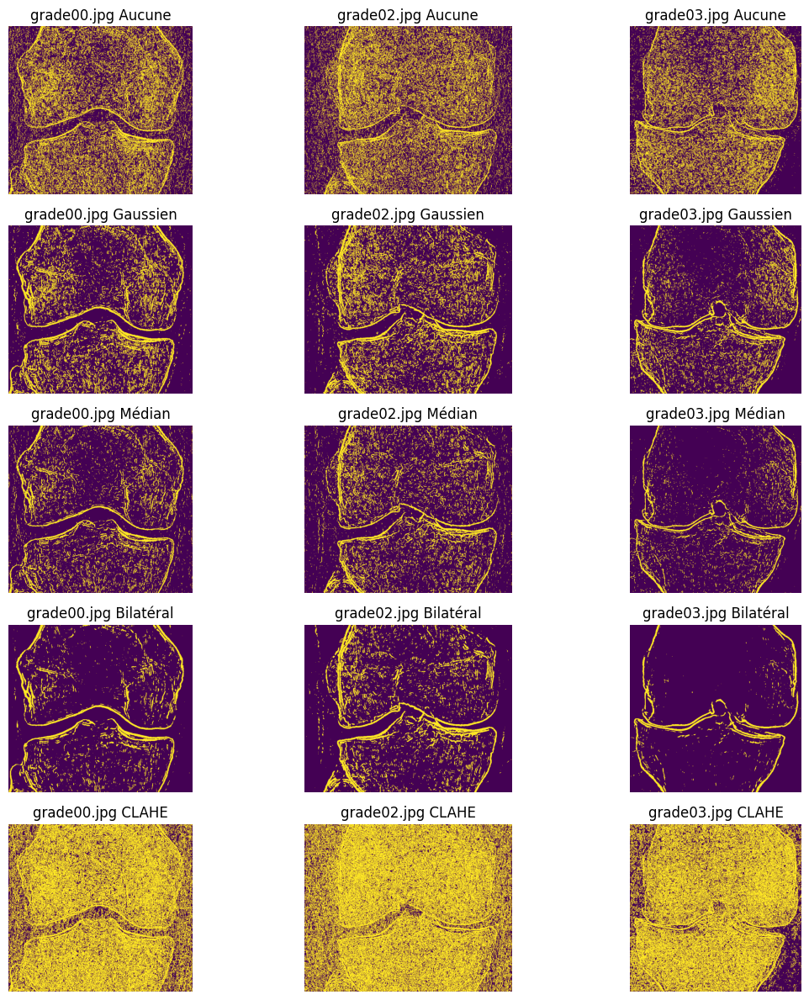

In [139]:
imgs = [image4, image5, image6]
img_names = ["grade00", "grade02", "grade03"]

# Pré-traitements à tester
preprocess_keys   = ["none", "gauss", "median", "bilat", "clahe"]
preprocess_labels = ["Aucune", "Gaussien", "Médian", "Bilatéral", "CLAHE"]

fig, axes = plt.subplots(len(preprocess_keys), 3, figsize=(12, 12))
edge_counts = {key: [] for key in preprocess_keys}

for c, (name, img) in enumerate(zip(img_names, imgs)):
    variants = preprocess_variants(img)
    for r, key in enumerate(preprocess_keys):
        v = variants[key]

        # Détection Scharr
        sx = cv2.Scharr(v, cv2.CV_32F, 1, 0)
        sy = cv2.Scharr(v, cv2.CV_32F, 0, 1)
        mag = cv2.magnitude(sx, sy)
        mag_u8 = cv2.convertScaleAbs(mag)

        # Seuillage automatique (Otsu)
        _, ed_bin = cv2.threshold(mag_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Affichage
        axes[r, c].imshow(ed_bin)
        axes[r, c].axis('off')

        # Comptage des pixels de contour
        edge_counts[key].append(int((ed_bin > 0).sum()))

# --- Titres explicites sur chaque case ---
axes[0,0].set_title("grade00.jpg Aucune")
axes[0,1].set_title("grade02.jpg Aucune")
axes[0,2].set_title("grade03.jpg Aucune")

axes[1,0].set_title("grade00.jpg Gaussien")
axes[1,1].set_title("grade02.jpg Gaussien")
axes[1,2].set_title("grade03.jpg Gaussien")

axes[2,0].set_title("grade00.jpg Médian")
axes[2,1].set_title("grade02.jpg Médian")
axes[2,2].set_title("grade03.jpg Médian")

axes[3,0].set_title("grade00.jpg Bilatéral")
axes[3,1].set_title("grade02.jpg Bilatéral")
axes[3,2].set_title("grade03.jpg Bilatéral")

axes[4,0].set_title("grade00.jpg CLAHE")
axes[4,1].set_title("grade02.jpg CLAHE")
axes[4,2].set_title("grade03.jpg CLAHE")
plt.tight_layout()



Les résultats montrent que les pré-traitements influencent nettement la qualité des contours détectés avec le filtre Scharr.
Sans filtrage, les images présentent beaucoup de bruit et des contours irréguliers. Le flou **gaussien** et le filtre **médian** réduisent visiblement le bruit tout en préservant les bords anatomiques. Le filtre **bilatéral** offre le meilleur compromis : il lisse efficacement les zones homogènes sans altérer la netteté des contours osseux. En revanche, l’**amélioration de contraste CLAHE** accentue fortement les hautes fréquences et introduit du bruit dans les zones sombres.
Globalement, les filtres de lissage (médian et bilatéral) améliorent la continuité et la lisibilité des bords, tandis que CLAHE dégrade la stabilité de la détection.


### Détection de contours avec la fonction équivalente à *edge()* de MATLAB

Dans cette partie, on reproduit la fonction **`edge()`** de MATLAB à l’aide d’**OpenCV** afin de comparer plusieurs opérateurs classiques de détection de contours : **Canny**, **Sobel**, **Prewitt** et **LoG (Laplacian of Gaussian)**.
L’objectif est d’analyser leurs différences de comportement sur les images médicales et d’évaluer leur sensibilité au bruit et aux variations d’intensité.
Chaque méthode utilise un seuillage automatique (Otsu ou seuils dérivés de la médiane) pour obtenir une carte binaire des contours.


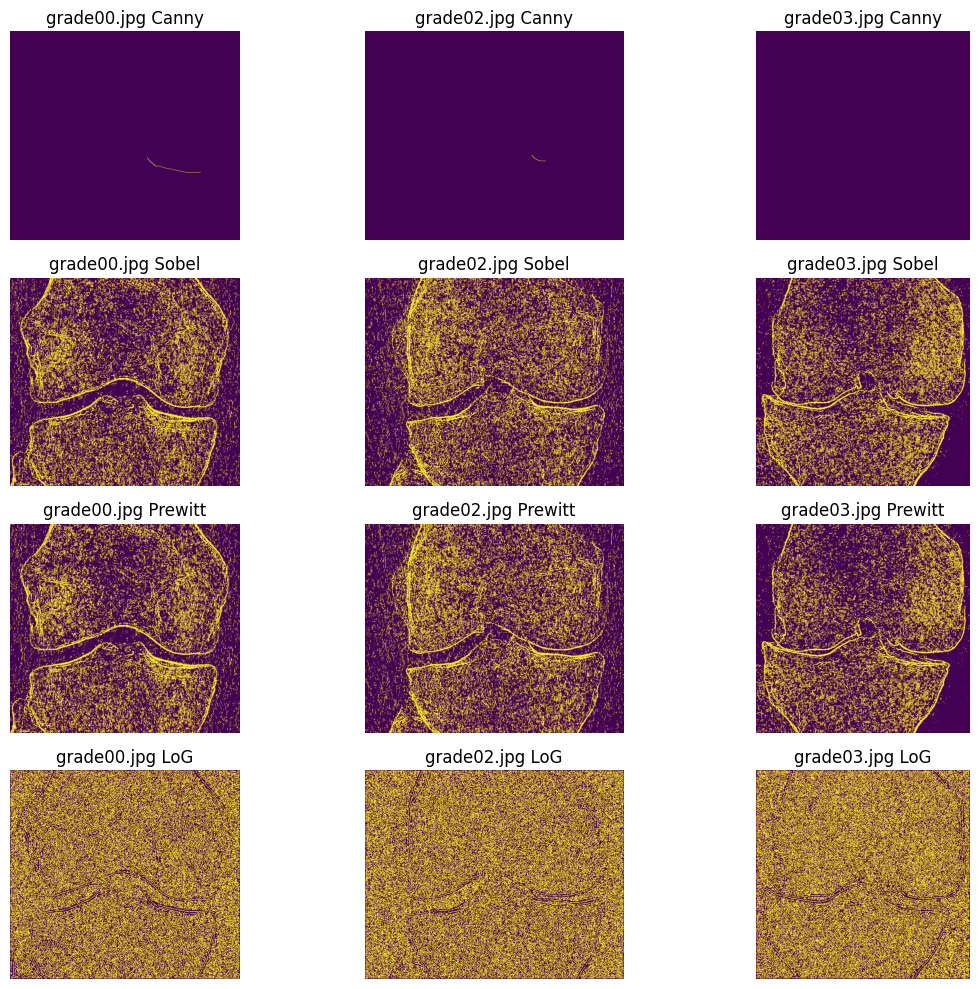

In [140]:
def matlab_edge_like_cv(img, method="canny", sigma=1.2):
    """
    Reproduction simplifiée de la fonction MATLAB 'edge' à l’aide d’OpenCV.
    Permet d’utiliser : 'canny', 'sobel', 'prewitt', 'log'.

    Args:
        img : image en niveaux de gris ou RGB (numpy array)
        method : type de détecteur ('canny', 'sobel', 'prewitt', 'log')
        sigma : écart-type du flou gaussien (pour Canny et LoG)

    Returns:
        Image binaire (uint8) contenant les contours détectés (0 ou 255)
    """
    g = to_gray_u8(img)  # conversion en niveau de gris 8 bits
    m = method.lower()

    if m == "canny":
        # Seuils automatiques à partir de la médiane de l’intensité
        med = np.median(g)
        low = int(max(0, 0.66 * med))
        high = int(min(255, 1.33 * med))
        ga = cv2.GaussianBlur(g, (0, 0), sigma)
        return cv2.Canny(ga, low, high)

    elif m == "sobel":
        # Dérivées Sobel + magnitude + seuillage Otsu
        sx = cv2.Sobel(g, cv2.CV_32F, 1, 0, ksize=3)
        sy = cv2.Sobel(g, cv2.CV_32F, 0, 1, ksize=3)
        mag = cv2.magnitude(sx, sy)
        mag_u8 = cv2.convertScaleAbs(mag)
        _, ed = cv2.threshold(mag_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return ed

    elif m == "prewitt":
        # Filtres Prewitt personnalisés
        kx = np.array([[-1, 0, 1],
                       [-1, 0, 1],
                       [-1, 0, 1]], np.float32)
        ky = kx.T
        px = cv2.filter2D(g, cv2.CV_32F, kx)
        py = cv2.filter2D(g, cv2.CV_32F, ky)
        mag = cv2.magnitude(px, py)
        mag_u8 = cv2.convertScaleAbs(mag)
        _, ed = cv2.threshold(mag_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return ed

    elif m == "log":
        # Laplacian of Gaussian (LoG) avec détection de zéros de croisement
        ga = cv2.GaussianBlur(g, (0, 0), sigma)
        lap = cv2.Laplacian(ga, cv2.CV_32F, ksize=3)
        zc = np.zeros_like(lap, np.uint8)
        zc[1:-1, 1:-1] = (
            ((lap[1:-1, 1:-1] * lap[:-2, 1:-1]) < 0) |
            ((lap[1:-1, 1:-1] * lap[2:, 1:-1]) < 0) |
            ((lap[1:-1, 1:-1] * lap[1:-1, :-2]) < 0) |
            ((lap[1:-1, 1:-1] * lap[1:-1, 2:]) < 0)
        ).astype(np.uint8) * 255
        return zc

    else:
        raise ValueError("method must be one of: 'canny', 'sobel', 'prewitt', 'log'")


mat_methods = ["canny", "sobel", "prewitt", "log"]
method_labels = ["Canny", "Sobel", "Prewitt", "LoG"]

fig, axes = plt.subplots(len(mat_methods), 3, figsize=(12, 10))

for r, (mname, label) in enumerate(zip(mat_methods, method_labels)):
    for c, (img_name, img) in enumerate(zip(["grade00", "grade02", "grade03"], [image4, image5, image6])):
        ed = matlab_edge_like_cv(img, mname, sigma=1.2)
        axes[r, c].imshow(ed)
        axes[r, c].axis('off')

# --- Titres explicites pour chaque cellule ---
axes[0,0].set_title("grade00.jpg Canny")
axes[0,1].set_title("grade02.jpg Canny")
axes[0,2].set_title("grade03.jpg Canny")

axes[1,0].set_title("grade00.jpg Sobel")
axes[1,1].set_title("grade02.jpg Sobel")
axes[1,2].set_title("grade03.jpg Sobel")

axes[2,0].set_title("grade00.jpg Prewitt")
axes[2,1].set_title("grade02.jpg Prewitt")
axes[2,2].set_title("grade03.jpg Prewitt")

axes[3,0].set_title("grade00.jpg LoG")
axes[3,1].set_title("grade02.jpg LoG")
axes[3,2].set_title("grade03.jpg LoG")

plt.tight_layout()


Les résultats montrent des comportements variés selon la méthode utilisée. Le détecteur **Canny** ne parvient pas à extraire correctement les contours, probablement à cause d’un lissage excessif ou de seuils trop élevés pour ce type d’image. Les filtres **Sobel** et **Prewitt** offrent des résultats similaires, révélant clairement les structures osseuses mais aussi du bruit résiduel sur le fond. La méthode **LoG (Laplacian of Gaussian)** accentue encore davantage le bruit, ce qui rend la carte de contours difficile à interpréter. Globalement, **Sobel** et **Prewitt** apparaissent comme les plus adaptés à ces images, tandis que **Canny** et **LoG** sont trop sensibles aux conditions de contraste et de texture.


<br>
<br>
<br>
<br>

### Estimation de la surface de la région distale

Dans cette partie, une méthode automatique est développée pour **estimer la surface de la région distale** sur les images médicales.
L’approche consiste à extraire la partie supérieure de l’image, à **améliorer le contraste** avec la méthode **CLAHE**, puis à **lisser** l’image avant d’appliquer un **seuillage automatique (Otsu)**.
Les plus grandes zones claires, correspondant aux structures osseuses, sont ensuite isolées afin de calculer leur **surface en pixels carrés**.
Le résultat est visualisé sous forme d’un **masque vert** superposé à l’image originale, indiquant la région distale détectée.


Estimated distal areas (px²): {'grade00': 16, 'grade02': 5, 'grade03': 4}


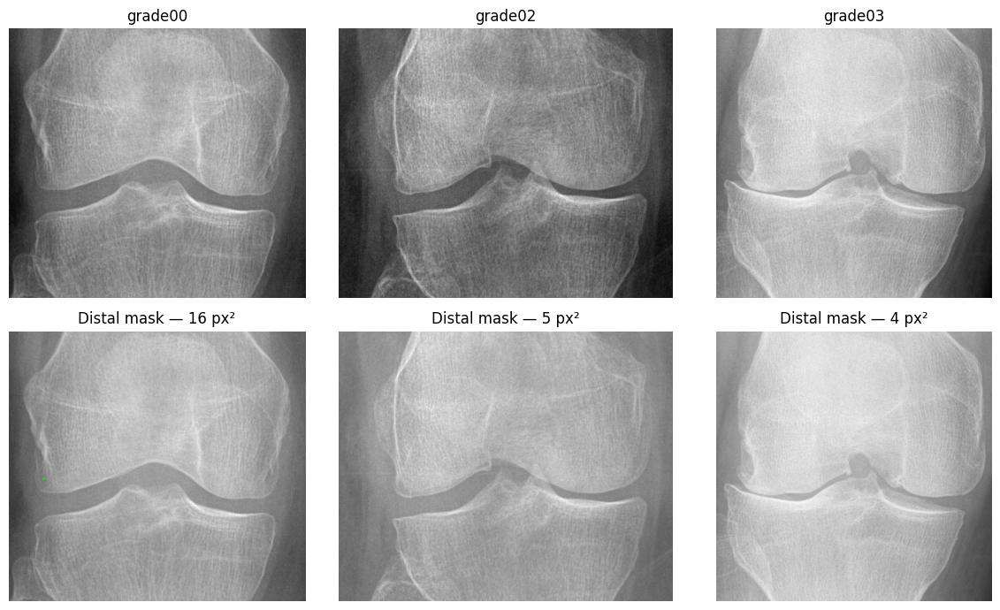

In [143]:
def estimate_distal_area(img, top_frac=0.55, min_frac=1/200):
    g = to_gray_u8(img)
    h, w = g.shape
    top_h = int(top_frac*h)
    roi = g[:top_h, :].copy()

    roi = cv2.createCLAHE(2.0,(8,8)).apply(roi)
    roi = cv2.GaussianBlur(roi, (5,5), 1.2)

    _, mask = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # on suppose os = clair ; sinon inverser
    # garder grands objets
    nb_min = int(h*w*min_frac)
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in cnts if cv2.contourArea(c) >= nb_min]
    m = np.zeros_like(g, np.uint8)
    if areas:
        cmax = cnts[int(np.argmax(areas))]
        cv2.drawContours(m[:top_h,:], [cmax], -1, 255, thickness=cv2.FILLED)
    area_px2 = int((m>0).sum())
    return area_px2, m

areas = {}
fig, axes = plt.subplots(2, 3, figsize=(12, 7))
for i, (nm, im) in enumerate(zip(["grade00","grade02","grade03"], [image4, image5, image6])):
    area, m = estimate_distal_area(im)
    areas[nm] = area
    axes[0, i].imshow(to_gray_u8(im), cmap='gray'); axes[0, i].axis('off'); axes[0, i].set_title(nm)
    rgb = cv2.cvtColor(to_gray_u8(im), cv2.COLOR_GRAY2BGR)
    rgb[m>0] = (0,255,0)
    axes[1, i].imshow(rgb); axes[1, i].axis('off'); axes[1, i].set_title(f"Distal mask — {area} px²")
plt.tight_layout()
print("Estimated distal areas (px²):", areas)


Les résultats montrent que la méthode permet bien d’isoler la **région distale la plus lumineuse** de chaque image.
Cependant, les **surfaces détectées restent faibles** et varient selon le **contraste local**, ce qui révèle une certaine **sensibilité du seuillage** à l’éclairage et à la densité osseuse.
Les **contours** sont globalement cohérents avec la forme de l’os, mais certaines zones sont **partiellement omises**, surtout dans les images plus claires.
Une étape de **post-traitement morphologique** pourrait améliorer la continuité et la précision des masques obtenus.


### Segmentation par méthodes basées sur les régions

Dans cette partie, plusieurs méthodes de **segmentation par régions** sont étudiées et appliquées aux images médicales afin de comparer leurs performances à celles des méthodes de détection de contours.
Les approches testées incluent le **K-Means**, le **Watershed**, et, si disponible, le **Fuzzy C-Means (FCM)**.
Ces techniques reposent sur la **similarité d’intensité** entre les pixels pour regrouper les zones homogènes, contrairement aux filtres de gradient utilisés précédemment.
L’objectif est d’isoler automatiquement la région osseuse la plus lumineuse et d’évaluer la **qualité des masques obtenus** à l’aide de la **surface en pixels** et de l’**indice de similarité de Jaccard** par rapport au masque distal extrait à la question précédente.


FCM non disponible (pip install scikit-fuzzy) — ignoré.
Areas (px²) par méthode: {'K-Means': {'grade00': 121562, 'grade02': 128323, 'grade03': 186645}, 'Watershed': {'grade00': 116324, 'grade02': 128761, 'grade03': 115946}}
Jaccard vs mask distal (Q5): {'K-Means': {'grade00': np.float64(0.0), 'grade02': np.float64(0.0), 'grade03': np.float64(0.0)}, 'Watershed': {'grade00': np.float64(0.0), 'grade02': np.float64(3.106506578027679e-05), 'grade03': np.float64(0.0)}}


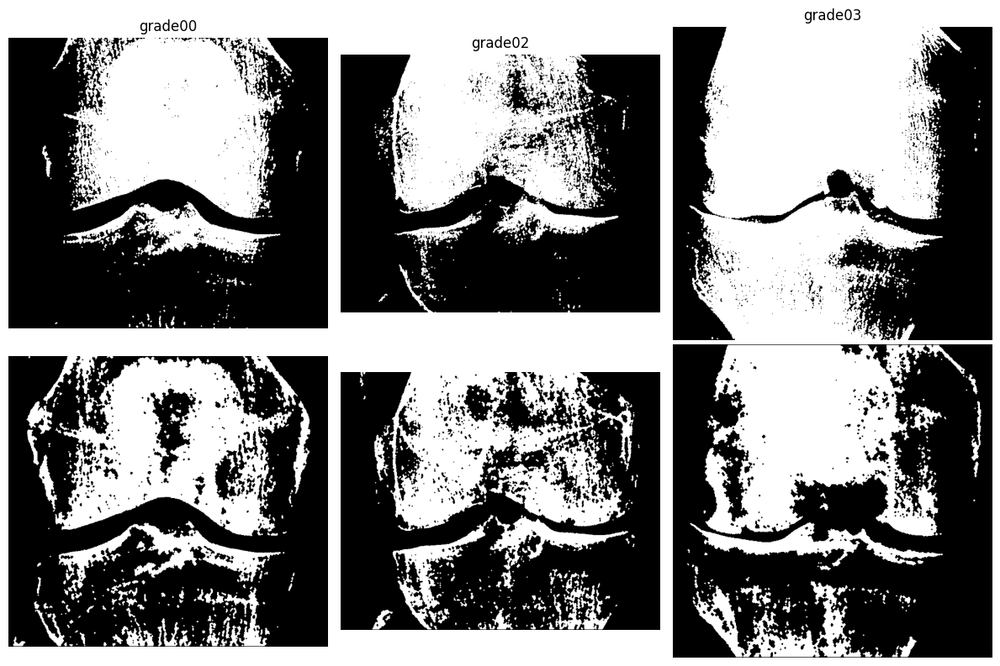

In [144]:
def kmeans_mask(img, k=3):
    g = to_gray_u8(img)
    Z = g.reshape(-1,1).astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS+cv2.TERM_CRITERIA_MAX_ITER, 80, 0.2)
    _ret, labels, centers = cv2.kmeans(Z, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)
    seg = labels.reshape(g.shape)
    bone_label = int(np.argmax(centers))    # le plus lumineux
    mask = (seg == bone_label).astype(np.uint8)*255
    # petit nettoyage morpho
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3)))
    return mask

def watershed_mask(img):
    g = to_gray_u8(img)
    # contraste local
    eq = cv2.createCLAHE(2.0,(8,8)).apply(g)
    # gradient pour relief
    gx = cv2.Sobel(eq, cv2.CV_32F, 1,0, ksize=3)
    gy = cv2.Sobel(eq, cv2.CV_32F, 0,1, ksize=3)
    grad = cv2.convertScaleAbs(cv2.magnitude(gx, gy))
    # marqueurs fond/objet par percentiles
    lo, hi = np.percentile(eq, 40), np.percentile(eq, 80)
    markers = np.zeros_like(g, np.int32)
    markers[eq <  lo] = 1
    markers[eq >  hi] = 2
    # watershed OpenCV attend 3 canaux → fabriquer image couleur factice
    three = cv2.merge([grad, grad, grad])
    cv2.watershed(three, markers)
    mask = (markers == 2).astype(np.uint8)*255
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3)))
    return mask

# (Option) Fuzzy C-Means si installé
have_fcm = True
try:
    import skfuzzy as fuzz
    def fcm_mask(img, c=3):
        g = to_gray_u8(img).astype(np.float64)
        data = g.flatten()
        cntr, u, *_ = fuzz.cluster.cmeans(data[None, :], c=c, m=2.0, error=0.005, maxiter=200, init=None)
        labels = np.argmax(u, axis=0).reshape(g.shape)
        bone_label = int(np.argmax(cntr))
        mask = (labels == bone_label).astype(np.uint8)*255
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3)))
        return mask
except Exception:
    have_fcm = False
    print("FCM non disponible (pip install scikit-fuzzy) — ignoré.")

meths = [("K-Means", kmeans_mask), ("Watershed", watershed_mask)]
if have_fcm: meths.append(("FCM", fcm_mask))

# Affichage masks
fig, axes = plt.subplots(len(meths), 3, figsize=(12, 4*len(meths)))
for r, (name, fn) in enumerate(meths):
    for c, (nm, im) in enumerate(zip(["grade00","grade02","grade03"], [image4, image5, image6])):
        m = fn(im)
        axes[r, c].imshow(m, cmap='gray'); axes[r, c].axis('off')
        if r == 0: axes[r, c].set_title(nm)
    axes[r, 0].set_ylabel(name, rotation=90, fontsize=10)
plt.tight_layout()

# Comparaison quanti avec le mask distal (Q5) : aires + Jaccard
def jaccard(a, b):
    a = (a>0); b = (b>0)
    inter = np.logical_and(a,b).sum()
    union = np.logical_or(a,b).sum()
    return inter/union if union>0 else 0.0

# Récupère les masks distaux calculés à Q5
distals = []
for im in [image4, image5, image6]:
    _, m = estimate_distal_area(im)
    distals.append(m)

areas_by, jacc_by = {}, {}
for (name, fn) in meths:
    areas_by[name], jacc_by[name] = {}, {}
    for nm, im, d in zip(["grade00","grade02","grade03"], [image4, image5, image6], distals):
        m = fn(im)
        areas_by[name][nm] = int((m>0).sum())
        jacc_by[name][nm]  = jaccard(m, d)

print("Areas (px²) par méthode:", areas_by)
print("Jaccard vs mask distal (Q5):", jacc_by)


Les résultats montrent que les méthodes de segmentation basées sur les régions parviennent globalement à isoler les zones osseuses lumineuses, mais avec des degrés de précision variables. Le **K-Means** segmente efficacement les structures principales, bien qu’il conserve du bruit dans les zones sombres. Le **Watershed** tend à **sur-segmenter**, créant plusieurs petites régions parasites autour des contours. Dans l’ensemble, ces approches permettent une séparation plus complète des tissus que les méthodes à base de contours, mais elles nécessitent un **post-traitement** pour améliorer la régularité et réduire le bruit résiduel.
